
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [1]:
!pip install pytorch_lightning
!pip install seaborn

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
from PIL import Image
import cv2

print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [3]:
import os
import pandas as pd
from tqdm import tqdm
from sklearn.utils import shuffle
def load_data(PATH):
    filenames = []
    outcomes = []
    for root, dirs, files in os.walk(PATH):
        for file in tqdm(files):
            if file.endswith(('.png', '.jpg', '.jpeg')):
                full_path = os.path.join(root, file)
                filenames.append(full_path)
                label = os.path.basename(root)
                outcomes.append(label)

    data = pd.DataFrame({
        'filename': filenames,
        'outcome': outcomes
    })
    data = shuffle(data, random_state=42).reset_index(drop=True)
    return data

train_data = load_data('/kaggle/input/birds1/train-20241213T072847Z-001')
val_data = load_data('/kaggle/input/birds1/valid-20241213T073016Z-001')
test_data = load_data('/kaggle/input/birds1/test-20241213T072821Z-001')
print(train_data.shape, val_data.shape, test_data.shape)

0it [00:00, ?it/s]
0it [00:00, ?it/s]
100%|██████████| 180/180 [00:00<00:00, 401368.80it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
100%|██████████| 5/5 [00:00<00:00, 48770.98it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
100%|██████████| 5/5 [00:00<00:00, 55775.32it/s]

(3208, 2) (100, 2) (100, 2)


In [4]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
combined_data  = pd.concat([train_data, test_data], axis=0).reset_index(drop=True)
combined_data['outcome'] = label_encoder.fit_transform(combined_data['outcome'])

In [5]:
combined_data.head()

,filename,outcome
0,/kaggle/input/birds1/train-20241213T072847Z-00...,2
1,/kaggle/input/birds1/train-20241213T072847Z-00...,1
2,/kaggle/input/birds1/train-20241213T072847Z-00...,6
3,/kaggle/input/birds1/train-20241213T072847Z-00...,6
4,/kaggle/input/birds1/train-20241213T072847Z-00...,6


## Plot some of the images

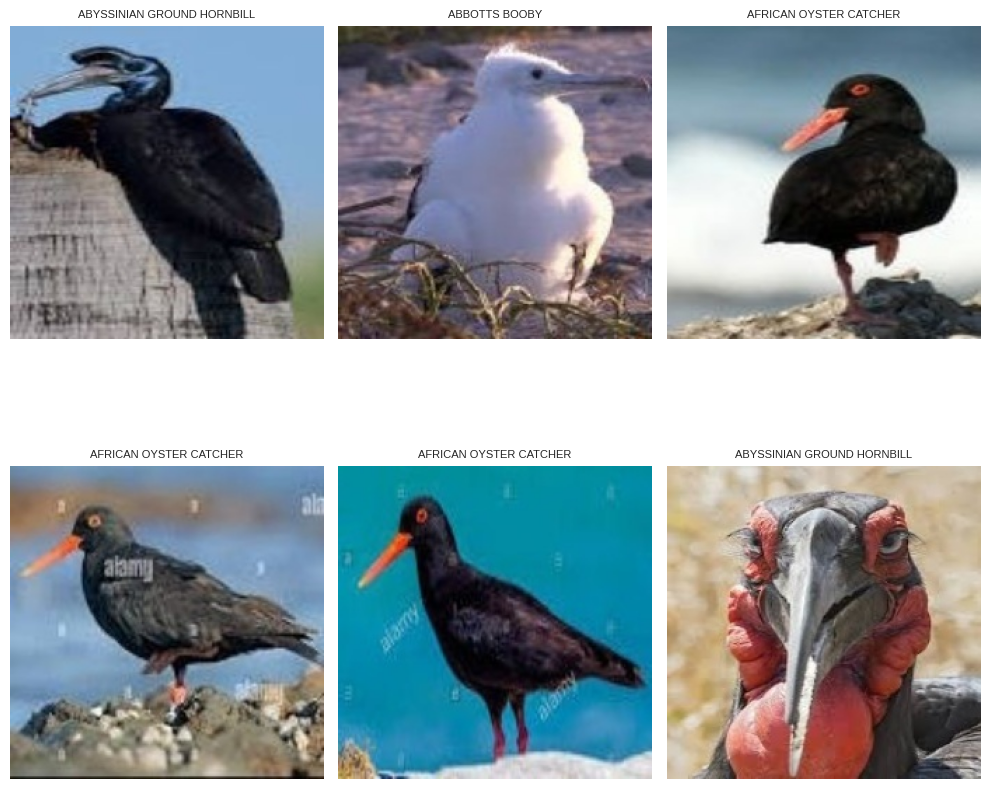

In [6]:
def plot_images(data, n_rows=20, n_cols=3):
    plt.figure(figsize=(10, 10))
    for i in range(n_rows * n_cols):
        if i >= len(data):
            break
        img_path = data.iloc[i]['filename']
        label = data.iloc[i]['outcome']
        image = plt.imread(img_path)

        plt.subplot(n_rows, n_cols, i + 1)
        plt.imshow(image)
        plt.title(label, fontsize=8)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

plot_images(train_data, n_rows=2, n_cols=3)

## Dataset Distribution
plot the distribution of the dataset, both training and validation set

In [7]:
train_data['outcome'] = label_encoder.fit_transform(train_data['outcome'])
val_data['outcome'] = label_encoder.fit_transform(val_data['outcome'])
test_data['outcome'] = label_encoder.fit_transform(test_data['outcome'])

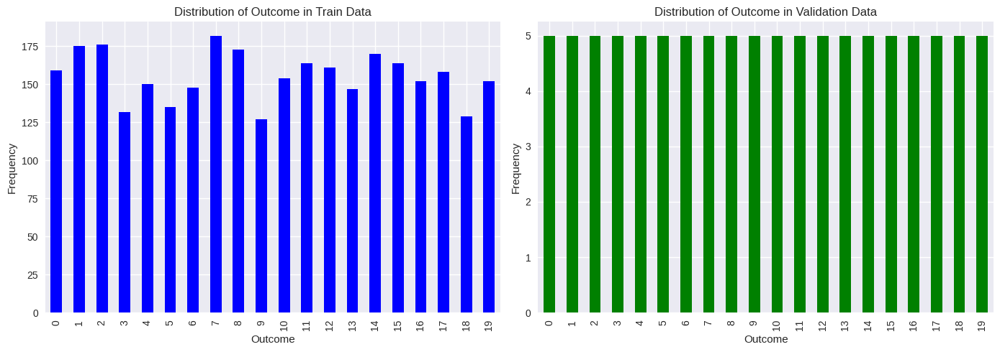

In [8]:
# TODO: Plot the distribution of 
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
train_data['outcome'][:-100].value_counts().sort_index().plot(kind='bar', ax=ax[0], color='blue')
ax[0].set_title('Distribution of Outcome in Train Data')
ax[0].set_xlabel('Outcome')
ax[0].set_ylabel('Frequency')
val_data['outcome'][-100:].value_counts().sort_index().plot(kind='bar', ax=ax[1], color='green')
ax[1].set_title('Distribution of Outcome in Validation Data')
ax[1].set_xlabel('Outcome')
ax[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [9]:
class BirdDataset(Dataset):
    def __init__(self, df, transform_input=None, transform_target=None):
        self.df = df
        self.transform_input = transform_input
        self.transform_target = transform_target

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img = plt.imread(self.df.iloc[idx]['filename'])

        grayscale_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        rgb_img = img  
        
        grayscale_img = Image.fromarray(grayscale_img)
        rgb_img = Image.fromarray(rgb_img)

        if self.transform_input:
            grayscale_img = self.transform_input(grayscale_img)
        if self.transform_target:
            rgb_img = self.transform_target(rgb_img)

        return grayscale_img, rgb_img

transform_input = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor()
])

transform_target = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor()
])

train_set = BirdDataset(train_data, transform_input=transform_input, transform_target=transform_target)
val_set = BirdDataset(val_data, transform_input=transform_input, transform_target=transform_target)


train_loader = DataLoader(train_set, batch_size=64, shuffle=True, num_workers=4)
val_loader = DataLoader(val_set, batch_size=64, shuffle=False, num_workers=4)


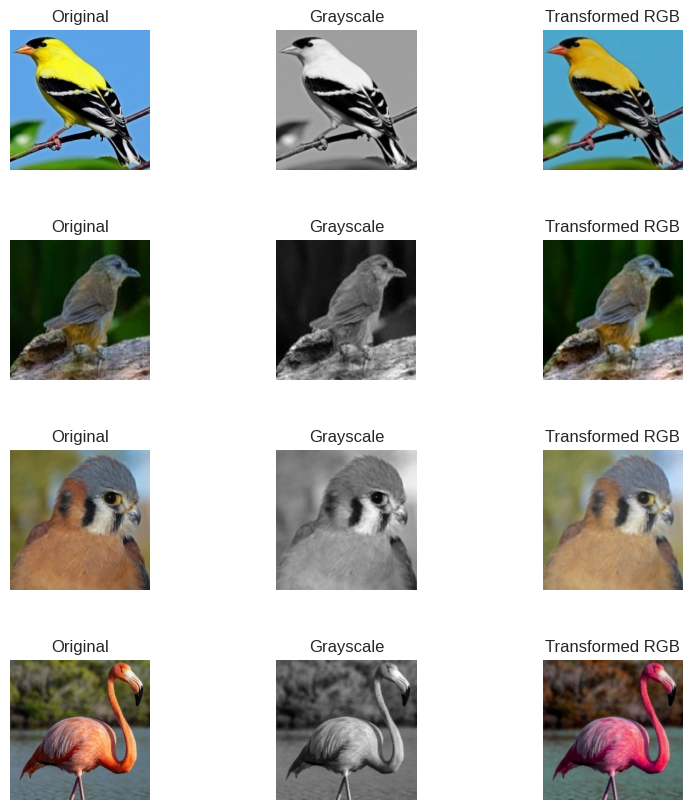

In [12]:
import matplotlib.pyplot as plt
import numpy as np

def imshow(img, title=None):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    if title is not None:
        plt.title(title)
    plt.axis('off')

num_images = 4
fig, axes = plt.subplots(nrows=num_images, ncols=3, figsize=(10, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.1)

for i in range(num_images):
    idx = np.random.randint(0, len(train_set)) 
    grayscale_img, rgb_img = train_set[idx]

    original_img = plt.imread(train_set.df.iloc[idx]['filename'])
    axes[i, 0].imshow(original_img)
    axes[i, 0].set_title('Original')
    axes[i, 0].axis('off')

    grayscale_img_pil = transforms.ToPILImage()(grayscale_img.squeeze(0))
    axes[i, 1].imshow(grayscale_img_pil, cmap='gray')
    axes[i, 1].set_title('Grayscale')
    axes[i, 1].axis('off')

    # Display transformed RGB image
    rgb_img_pil = transforms.ToPILImage()(rgb_img)
    axes[i, 2].imshow(rgb_img_pil)
    axes[i, 2].set_title('Transformed RGB')
    axes[i, 2].axis('off')

plt.show()

**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**

- Importance of Data Augmentation
Expanding the Dataset: Data augmentation artificially increases the size of the training dataset by creating modified versions of images. This is especially valuable when the original dataset is small, which is common in specialized domains.

- Reducing Overfitting: By introducing a variety of transformations, data augmentation helps the model learn more general features rather than memorizing specific image attributes. This reduces the likelihood of overfitting, where a model performs well on training data but poorly on unseen data.

- Improving Model Robustness: Augmentation introduces a range of variations that a model might face in real-world scenarios, such as different lighting conditions, orientations, and backgrounds. This helps in training models that are robust across diverse conditions.

- Enforcing Invariances: Certain augmentations can train models to be invariant to changes that don’t affect the underlying class labels. For example, a model trained with rotated images will learn to recognize objects regardless of their orientation.

## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [71]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
from tqdm import tqdm
    

## without perceptual loss function 

class Encoder(nn.Module):
    def __init__(self, latent_dim=128, do_bn=False):
        super(Encoder, self).__init__()
        def conv_block(in_c, out_c):
            layers = [
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_c) if do_bn else nn.Identity(),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(2)
            ]
            return nn.Sequential(*layers)

        self.encoder = nn.Sequential(
            conv_block(1, 32),
            conv_block(32, 64),
            conv_block(64, 128),
            conv_block(128, 256)
        )

        self.fc_mean = nn.Linear(256 * 10 * 10, 128)
        self.fc_logvar = nn.Linear(256 * 10 * 10, 128)

    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)
        return self.fc_mean(x), self.fc_logvar(x)


class Decoder(nn.Module):
    def __init__(self, latent_dim=128, do_bn=False):
        super(Decoder, self).__init__()

        def upsample_block(in_c, out_c):
            layers = [
                nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2),
                nn.BatchNorm2d(out_c) if do_bn else nn.Identity(),
                nn.ReLU(inplace=True)
            ]
            return nn.Sequential(*layers)

        self.fc = nn.Linear(128, 256 * 10 * 10)

        self.decoder = nn.Sequential(
            upsample_block(256, 128),
            upsample_block(128, 64),
            upsample_block(64, 32),
            upsample_block(32, 16),
            nn.Conv2d(16, 3, kernel_size=3, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.fc(x).view(x.size(0), 256, 10, 10)
        return self.decoder(x)


class Net(nn.Module):
    def __init__(self, do_bn=False):
        super(Net, self).__init__()
        self.encoder = Encoder(do_bn)
        self.decoder = Decoder(do_bn)
        self.optim = torch.optim.Adam(self.parameters(), lr=1e-3)
        self.beta = 1e-6

    def reparameterize(self, mu, log_var):
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mean, logvar = self.encoder(x)
        z = self.reparameterize(mean, logvar)
        return self.decoder(z), mean, logvar

    def compute_loss(self, recon, target, mu, log_var):
        criterion = nn.MSELoss()
        recon_loss = criterion(recon, target)
        kl_loss = torch.mean(-0.5 * torch.mean(1 + log_var - mu ** 2 - log_var.exp(), dim = 1), dim = 0)
        return recon_loss + self.beta * kl_loss

    def training_step(self, X):
        gray, rgb = X
        gray, rgb = gray.to(device), rgb.to(device)

        recon, mu, log_var = self.forward(gray)
        total_loss = self.compute_loss(recon, rgb, mu, log_var)

        self.optim.zero_grad()
        total_loss.backward()
        self.optim.step()

        return total_loss.item()

    def validation_step(self, batch):
        self.eval()
        gray, rgb = batch
        gray, rgb = gray.to(device), rgb.to(device)
        recon, mean, logvar = self.forward(gray)
        return self.compute_loss(recon, rgb, mean, logvar)

    def train_model(self, train_loader, val_loader, epochs=10):
        train_history, val_history = [], []

        for epoch in range(epochs):
            self.train()
            train_losses = 0
            pbar1 = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} - Training")
            for batch in pbar1:
                train_loss = self.training_step(batch)
                train_losses += train_loss
                pbar1.set_postfix({'train loss : ': train_loss})
            
            val_losses = 0
            with torch.no_grad():
                pbar2 = tqdm(val_loader, desc=f"Epoch {epoch + 1}/{epochs} - Validation")
                for batch in pbar2:
                    val_loss = self.validation_step(batch)
                    val_losses += val_loss
                    pbar2.set_postfix({'val loss : ': val_loss})

            train_history.append(train_losses/len(train_loader))
            val_history.append(val_losses/len(val_loader))

            print(f"Epoch {epoch + 1}/{epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

        return train_history, val_history


In [72]:
# TODO: print the model
model = Net().to(device)
# print(model)

## Training Phase

In [73]:
# TODO: Train
# Students should implement the training loop. During training, monitor both training and validation metrics
# to ensure the model learns effectively without overfitting.
train_history, val_history = model.train_model(train_loader, val_loader, epochs = 20)

Epoch 1/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  2.21it/s, val loss : =tensor(0.0621, device='cuda:0')]


Epoch 1/20 - Train Loss: 0.0586, Val Loss: 0.0621


Epoch 2/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, val loss : =tensor(0.0481, device='cuda:0')]


Epoch 2/20 - Train Loss: 0.0454, Val Loss: 0.0481


Epoch 3/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, val loss : =tensor(0.0409, device='cuda:0')]


Epoch 3/20 - Train Loss: 0.0315, Val Loss: 0.0409


Epoch 4/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, val loss : =tensor(0.0335, device='cuda:0')]


Epoch 4/20 - Train Loss: 0.0224, Val Loss: 0.0335


Epoch 5/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  2.49it/s, val loss : =tensor(0.0329, device='cuda:0')]


Epoch 5/20 - Train Loss: 0.0340, Val Loss: 0.0329


Epoch 6/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, val loss : =tensor(0.0342, device='cuda:0')]


Epoch 6/20 - Train Loss: 0.0287, Val Loss: 0.0342


Epoch 7/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, val loss : =tensor(0.0295, device='cuda:0')]


Epoch 7/20 - Train Loss: 0.0253, Val Loss: 0.0295


Epoch 8/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, val loss : =tensor(0.0261, device='cuda:0')]


Epoch 8/20 - Train Loss: 0.0280, Val Loss: 0.0261


Epoch 9/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, val loss : =tensor(0.0272, device='cuda:0')]


Epoch 9/20 - Train Loss: 0.0322, Val Loss: 0.0272


Epoch 10/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, val loss : =tensor(0.0265, device='cuda:0')]


Epoch 10/20 - Train Loss: 0.0239, Val Loss: 0.0265


Epoch 11/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, val loss : =tensor(0.0248, device='cuda:0')]


Epoch 11/20 - Train Loss: 0.0198, Val Loss: 0.0248


Epoch 12/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, val loss : =tensor(0.0261, device='cuda:0')]


Epoch 12/20 - Train Loss: 0.0232, Val Loss: 0.0261


Epoch 13/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, val loss : =tensor(0.0265, device='cuda:0')]


Epoch 13/20 - Train Loss: 0.0208, Val Loss: 0.0265


Epoch 14/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, val loss : =tensor(0.0258, device='cuda:0')]


Epoch 14/20 - Train Loss: 0.0311, Val Loss: 0.0258


Epoch 15/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, val loss : =tensor(0.0278, device='cuda:0')]


Epoch 15/20 - Train Loss: 0.0213, Val Loss: 0.0278


Epoch 16/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, val loss : =tensor(0.0281, device='cuda:0')]


Epoch 16/20 - Train Loss: 0.0270, Val Loss: 0.0281


Epoch 17/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, val loss : =tensor(0.0233, device='cuda:0')]


Epoch 17/20 - Train Loss: 0.0268, Val Loss: 0.0233


Epoch 18/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, val loss : =tensor(0.0232, device='cuda:0')]


Epoch 18/20 - Train Loss: 0.0231, Val Loss: 0.0232


Epoch 19/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, val loss : =tensor(0.0263, device='cuda:0')]


Epoch 19/20 - Train Loss: 0.0231, Val Loss: 0.0263


Epoch 20/20 - Validation: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, val loss : =tensor(0.0251, device='cuda:0')]

Epoch 20/20 - Train Loss: 0.0203, Val Loss: 0.0251


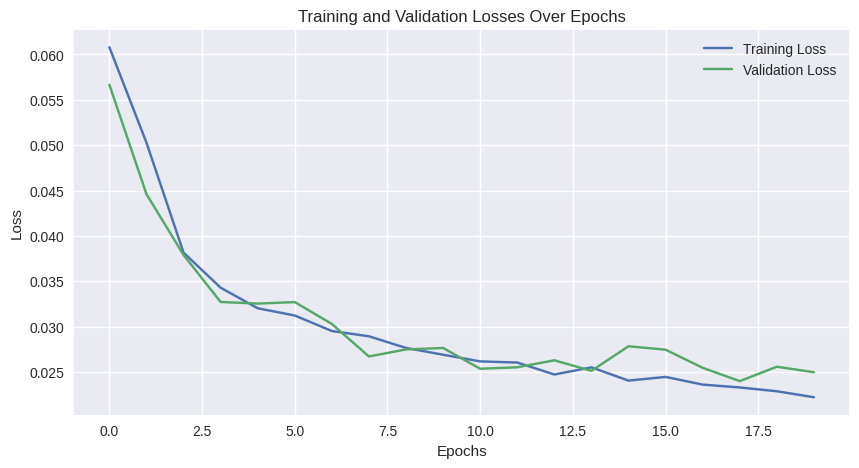

In [90]:
def plot_losses(train_losses, val_losses):
    # Ensure the inputs are on the CPU and converted to NumPy arrays
    train_losses = [loss.cpu().numpy() if torch.is_tensor(loss) else loss for loss in train_losses]
    val_losses = [loss.cpu().numpy() if torch.is_tensor(loss) else loss for loss in val_losses]
    
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Training and Validation Losses Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

# Call the function with train_history and val_history
plot_losses(train_history, val_history)


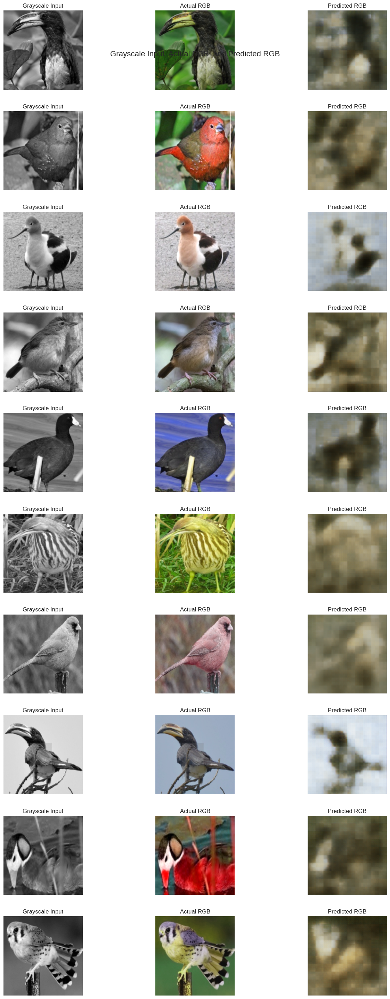

In [76]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import torch

# Function to visualize the latent space
def visualize_latent_space(encoder, data_loader, num_samples=1000):
    """
    Uses a 2-dimensional t-SNE plot to visualize latent space of encoded images.
    
    Parameters:
    encoder (torch.nn.Module): The encoder model component of the VAE.
    data_loader (torch.utils.data.DataLoader)
    num_samples (int): Number of samples to visualize
    """
    encoder.eval()  # Set model to evaluation mode
    latent_vectors = []
    with torch.no_grad():  # Disable gradient computation
        for batch_idx, (images, _) in enumerate(data_loader):
            if len(latent_vectors) * images.size(0) >= num_samples:
                break
            images = images.to(encoder.device)  # Move images to the same device as model
            mu, _ = encoder(images)  # Assuming the encoder returns mean (mu) and log variance (logvar)
            latent_vectors.append(mu)

    # Limit the number of samples based on the user's preference
    latent_vectors = torch.cat(latent_vectors, dim=0)[:num_samples].cpu().numpy()

    # t-SNE reduction to 2D for visualization
    tsne = TSNE(n_components=2, random_state=42)
    tsne_results = tsne.fit_transform(latent_vectors)

    # Plotting the 2D projection
    plt.figure(figsize=(10, 6))
    plt.scatter(tsne_results[:, 0], tsne_results[:, 1], s=10, cmap='Spectral')
    plt.colorbar()
    plt.title('Latent Space Visualization using t-SNE')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.show()

# Note: Use visualize_latent_space function post-training to observe the latent space


test_dataset = BirdDataset(test_data, transform_input=transform_input, transform_target=transform_target)

plot_predictions(test_dataset, model, device, num_samples=10)

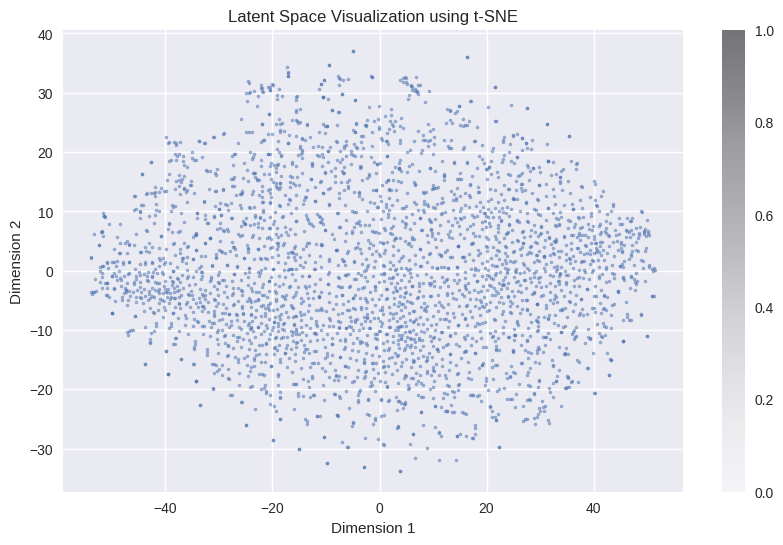

In [96]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import torch

def visualize_latent_space(encoder, data_loader, num_samples=1000):
    encoder.eval()  # Set the model to evaluation mode
    latent_vectors = []
    with torch.no_grad():
        for i, (images, _) in enumerate(data_loader):
            if len(latent_vectors) * images.shape[0] >= num_samples:
                break
            images = images.to(device)  # Assume 'device' is defined or fetch it dynamically
            mu, _ = encoder(images)
            latent_vectors.append(mu)

    latent_vectors = torch.cat(latent_vectors)[:num_samples].cpu().numpy()

    # Set the perplexity to a value less than num_samples
    perplexity_value = min(30, num_samples - 1)  # Ensure perplexity is less than num_samples
    tsne = TSNE(n_components=2, random_state=0, perplexity=perplexity_value)
    embedded_latent = tsne.fit_transform(latent_vectors)

    plt.figure(figsize=(10, 6))
    plt.scatter(embedded_latent[:, 0], embedded_latent[:, 1], s=5, alpha=0.5)
    plt.title('Latent Space Visualization using t-SNE')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.colorbar()
    plt.show()

# Example use
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
visualize_latent_space(model.encoder, train_loader, num_samples=10000)


How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?
    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?

    - In the latent space of a VAE, we might observe clusters forming that correspond to specific image features or categories. If such clusters are identifiable, it suggests that the VAE is learning to encode visually or contextually similar images into proximate areas in the latent space. This is crucial for effective generalization and transformation from grayscale to color:

    - Identification of Clusters: If clusters in the latent space align with particular image attributes or categories (like images of skies, oceans, or forests in different lighting conditions), it indicates that the VAE recognizes and separates different types of visual content.
    - Implications for Color Information: The presence of these clusters can inform us about the VAE's ability to differentiate between various input characteristics. For example, different clusters might correspond to different natural color schemes, such as varying shades of green for forests and blues for bodies of water. This clustering means the VAE can potentially predict appropriate color palettes for different grayscale inputs.
    - 
2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?
    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?

    - The behavior of neighboring points in the latent space and their corresponding outputs can reveal much about the VAE’s internal representation:

    - Neighboring Points and Similarity: If neighboring points in the latent space consistently result in similar color outputs, it implies that the latent space is well-organized and smooth. This smoothness is desirable because it suggests that small changes in input features (like slight variations in grayscale values) lead to predictable and minor changes in color output.
    - Impact on Generated Colorations: This continuity is particularly important for handling images with gradual transitions, such as changes in lighting or shading. A smooth latent space ensures that these transitions are reflected in a similarly smooth transition in color space, enhancing the realism and quality of the colorized images.

3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?

    - Using dimensionality reduction techniques like t-SNE to visualize the high-dimensional latent space on a 2D plane can be a powerful tool to understand the VAE’s encoding strategy, but it comes with limitations:

    - Effectiveness of t-SNE: t-SNE is effective at revealing clusters and patterns in data by preserving local neighborhoods, making it a good choice for visualizing how different types of input images are encoded in the latent space.
    - Limitations: However, t-SNE can sometimes exaggerate clusters and does not necessarily preserve global relationships well. This means while apparent clusters might suggest distinct groups, the actual distances between these groups in the original high-dimensional space may not be accurately represented.
    - Impact on Interpretation: These limitations necessitate cautious interpretation of the 2D visualization. While helpful to identify clusters and transitions, it might not fully convey the true relationships in higher dimensions, potentially leading to misleading conclusions about the model’s performance.

Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?

Comparison with Pixel-wise Losses Like MSE
1. Measurement of Image Similarity:

    - Pixel-wise Losses (e.g., MSE): These losses evaluate the difference between images strictly based on pixel values. They calculate the average squared difference across corresponding pixels between the predicted and true images. While straightforward and mathematically simple, MSE can lead to images that are technically close in numerical error but visually and qualitatively dissatisfying. It tends to produce blurry images, especially in areas with high detail or color variance because it averages out pixel values.

    - Perceptual Loss: Instead of comparing pixel values directly, perceptual loss measures differences in feature representations extracted from deeper layers of a CNN. These layers encode more abstract attributes of the image, such as content and style. For example, using the VGG network, the loss might be computed based on the differences in feature activations after multiple convolutional layers. This method aligns better with how humans perceive images, emphasizing structural and textural fidelity over exact pixel values.

2. Advantages Over MSE in Colorization:

    - Preservation of Textural Details: Perceptual loss helps in maintaining textural details that are often lost with MSE. This is crucial for colorization where the texture can convey important information about the object and its environment.
    - Avoidance of Blurring: While MSE can result in averaging effects and blurring, perceptual loss encourages the preservation of sharp edges and fine details, improving the clarity and crispness of colorized images.
    - Better Handling of Complex Patterns: In scenarios involving complex color patterns and transitions, perceptual loss can more effectively manage the nuances of color gradients and shading, reflecting a more natural and coherent scene.
  
  - Overall, perceptual loss is highly effective for tasks like image colorization, where the goal is not just to match pixel values but to produce outputs that are pleasing and realistic to the human eye. It addresses many of the limitations associated with traditional pixel-wise error measurements, leading to superior results in terms of both visual richness and technical accuracy. This makes it a preferred choice for enhancing the quality of colorized images, ensuring that they are not only accurate in terms of content but also beautiful and engaging visually.

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?

### Impact of Latent Space on Fidelity and Diversity

1. **Fidelity**:
   - **High Fidelity**: For a VAE to generate high-fidelity images, its latent space must effectively capture the essential data characteristics from the training dataset. A well-structured latent space allows the VAE to reconstruct images that closely resemble the input data in terms of color accuracy, details, and overall appearance.
   - **Encoding Depth**: The depth and complexity of the latent space determine how well subtle nuances and complexities of the input data are encoded. More expressive latent dimensions can capture intricate details necessary for high-resolution and detailed image generation.

2. **Diversity**:
   - **Variability**: The diversity of the generated images largely depends on the scope of the latent space. A broader latent space with adequate dimensions allows for exploring a wide variety of image outputs from the same input, reflecting different possible colorizations.
   - **Sampling Space**: The ability to sample varied yet plausible points from the latent space without deviating into unrealistic outputs is crucial. This sampling determines how diverse the generated images can be while still maintaining relevance to the input data.

### Effects of Varying the Dimensionality of the Latent Space

1. **Increasing Dimensionality**:
   - **Enhanced Detail Capture**: A higher-dimensional latent space can potentially encode more detailed and complex features of the input data, which can improve the fidelity of the generated images. This can be particularly useful in colorization tasks where detailed color patterns and textures are important.
   - **Risk of Overfitting**: However, too high a dimensionality might lead the model to overfit, especially if the training dataset is not sufficiently large or diverse. Overfitting would result in the model performing well on training data but poorly on unseen data, reducing its generalization capabilities.

2. **Reducing Dimensionality**:
   - **Generalization**: A more compact latent space can force the VAE to learn the most salient features of the data, potentially improving its ability to generalize from limited examples. This can be advantageous in producing more consistent and stable outputs.
   - **Loss of Detail and Diversity**: On the downside, too few dimensions might limit the model's capacity to capture and recreate the full complexity of the input data, leading to a loss in image detail and diversity in colorization.

3. **Optimal Dimensionality**:
   - **Balancing Act**: Finding the optimal size of the latent space is a balancing act between too much and too little. The right dimensionality should be enough to capture the necessary data features without capturing noise or overfitting the model. This often requires experimentation and adjustment based on the specific characteristics of the dataset and the desired quality and variety of the outputs.


# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [26]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries
...
print ('modules loaded')

modules loaded


## Load the Dataset

(290, 256, 256, 3)
(290, 256, 256, 1)


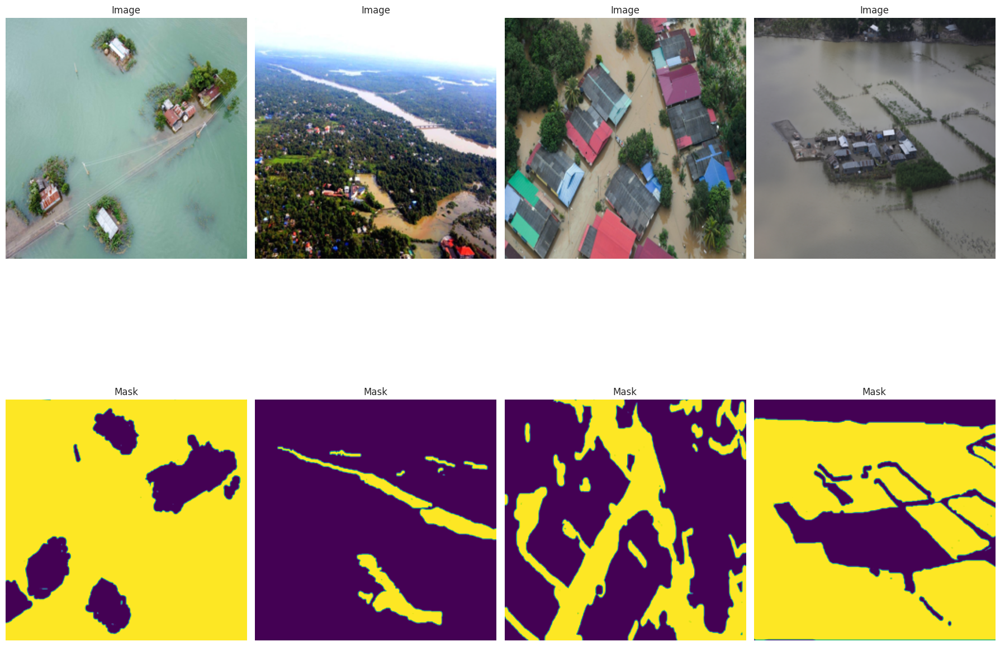

In [54]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def create_data(data_dir):
    """
    Traverse through the given data directory to extract and return paths to images and masks.
    - Identify relevant folders for images and masks.
    - Collect file paths from these folders and return them as lists.
    """
    image_dir = os.path.join(data_dir, 'Image-20241222T100451Z-001/Image')
    mask_dir = os.path.join(data_dir, 'Mask-20241222T100451Z-001/Mask')
    
    # List of valid image extensions
    valid_extensions = ['.png', '.jpeg', '.jpg']
    
    image_paths = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir) 
                   if any(f.endswith(ext) for ext in valid_extensions)])
    mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir) 
                  if any(f.endswith(ext) for ext in valid_extensions)])
    return image_paths, mask_paths

def load_image(path, SIZE):
    """
    Load and resize an individual image to the specified size, scaling pixel values appropriately.
    - Convert image to array and normalize pixel values.
    - Use resizing techniques to ensure uniform image dimensions.
    """
    with Image.open(path).convert("RGB") as img:
        img = img.resize((SIZE, SIZE))
        return np.array(img) / 255.0

def load_images(image_paths, SIZE, mask=False, trim=None):
    """
    Batch process a list of image paths, loading and organizing images into a numpy array.
    - Handle both image and mask files optionally, managing different channel dimensions.
    - Optionally trim the list of images to handle a subset of data.
    """
    if trim:
        image_paths = image_paths[:trim]
    
    processed_images = []
    for path in image_paths:
        img = Image.open(path)
        if mask:
            img = img.convert("L")  # Convert masks to grayscale
        else:
            img = img.convert("RGB")
        img = img.resize((SIZE, SIZE))
        img = np.array(img) / 255.0  # Normalize
        if mask:
            img = np.expand_dims(img, axis=-1)  # Add channel dimension for masks
        processed_images.append(img)

    return np.array(processed_images)

def show_image(image, title=None, cmap=None, alpha=1):
    """
    Display a single image using matplotlib with options for color map and transparency.
    - Ensure axes are turned off for a cleaner display.
    - Include optional title for context.
    """
    plt.imshow(image, cmap=cmap, alpha=alpha)
    plt.axis('off')
    if title:
        plt.title(title)
    plt.show()

def show_mask(image, mask, cmap='viridis', alpha=0.4):
    """
    Overlay a mask on an image to visualize segmentation results.
    - Use transparency to allow both mask and image to be visible.
    - Include color mapping to differentiate mask areas.
    """
    plt.imshow(image)
    plt.imshow(mask.squeeze(), cmap=cmap, alpha=alpha)
    plt.axis('off')
    plt.show()

def show_images(imgs, masks):
    """
    Display multiple image-mask pairs to examine the dataset distribution.
    - Randomly select sample pairs of images and masks for visualization.
    - Use subplots to arrange visuals neatly and use tight layout for optimization.
    """
    n_samples = min(len(images), 4)  # Show up to 5 pairs
    sample_indices = random.sample(range(len(images)), n_samples)

    plt.figure(figsize=(18, 12))  # Increased figure size
    for i, idx in enumerate(sample_indices):
        # Show image
        plt.subplot(2, n_samples, i + 1)
        plt.imshow(images[idx])
        plt.axis('off')
        plt.title("Image")

        plt.subplot(2, n_samples, i + 1 + n_samples)
        plt.imshow(images[idx])
        plt.imshow(masks[idx].squeeze(), cmap='viridis')
        plt.axis('off')
        plt.title("Mask")

    # Adjust layout to improve spacing between images
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.4)  # Adjust vertical spacing
    plt.show()

SIZE = 256

# Example usage:
data_dir = '/kaggle/input/sagkhar/'
image_paths, mask_paths = create_data(data_dir)
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)
print(images.shape)
print(masks.shape)

# Visualizing multiple image-mask pairs
show_images(images, masks)


## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [75]:
# Enhancing U-Net with Dice and Jaccard Losses for Segmentation

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        

    def forward(self, pred, target):
        """
        Compute the Dice coefficient loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        pred = pred.view(-1)
        target = target.view(-1)

        # Calculate intersection and union.
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum()

        # Compute Dice coefficient.
        dice_coef = (2. * intersection + self.smooth) / (union + self.smooth)

        # Dice loss is 1 minus Dice coefficient.
        return 1 - dice_coef

    
class JaccardLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(JaccardLoss, self).__init__()
        self.smooth = smooth
        
    def forward(self, pred, target):
        """
        Compute the Jaccard (IoU) loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        pred = pred.view(-1)
        target = target.view(-1)

        # Calculate intersection and union.
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum() - intersection

        # Compute Jaccard index (Intersection over Union, IoU).
        jaccard_index = (intersection + self.smooth) / (union + self.smooth)

        # Jaccard loss is 1 minus the Jaccard index.
        return 1 - jaccard_index
    

In [76]:
class CompleteAttentionBlock(nn.Module):
    def __init__(self, F_l, F_int, F_g):
        super(CompleteAttentionBlock, self).__init__()
        
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=3, stride = 2, padding = 1),
            nn.BatchNorm2d(F_int),
        )
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1),
            nn.BatchNorm2d(F_int),
        )
        
        self.relu = nn.ReLU(inplace=True)
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, F_int, kernel_size=1),
            nn.BatchNorm2d(F_int),
        )
        
        self.sigmoid = nn.Sigmoid()
        self.upsample = nn.ConvTranspose2d(F_int, F_l, kernel_size=2, stride = 2)

    def forward(self, x, g):
                
        x_out = self.W_x(x)
        g_out = self.W_g(g)
        relu_out = self.relu(x_out + g_out)
        psi = self.psi(relu_out)
        sig_out = self.sigmoid(psi)
        resampled = self.upsample(sig_out)
        
        return x * resampled

In [77]:
class AttentionBlock(nn.Module):
    def __init__(self, F_l, F_int, F_g):
        super(AttentionBlock, self).__init__()
        
        self.W_x = nn.Conv2d(F_l, F_int, kernel_size=1)
        self.W_g = nn.ConvTranspose2d(F_g, F_int, kernel_size = 2, stride = 2)
        self.relu = nn.ReLU(inplace=True)
        self.psi = nn.Conv2d(F_int, F_int, kernel_size=1)

    def forward(self, x, g):
                
        x_out = self.W_x(x)
        g_out = self.W_g(g)
        relu_out = self.relu(x_out + g_out)
        psi = self.psi(relu_out)
        
        return x * psi

In [113]:
class UNet_With_Attention(nn.Module):
    def __init__(self, in_ch=3, n_filters = 32, n_classes = 1):
        """
        UNet with Attention

        Arguments:
            in_ch -- Number of channels of input tensor from previous layer
            out_channel -- Number of channels of output tensor
        """
        super().__init__()
        
        # Down-sampling
        self.encoder1 = conv_block(in_ch = in_ch, n_filters = n_filters, dropout_prob = 0, max_pooling=True)
        self.encoder2 = conv_block(in_ch = n_filters, n_filters = 2 * n_filters, dropout_prob = 0, max_pooling=True)
        self.encoder3 = conv_block(in_ch = 2 * n_filters, n_filters = 4 * n_filters, dropout_prob = 0, max_pooling=True)
        self.encoder4 = conv_block(in_ch = 4 * n_filters, n_filters = 8 * n_filters, dropout_prob = 0, max_pooling=True)
        self.encoder5 = conv_block(in_ch = 8 * n_filters, n_filters = 16 * n_filters, dropout_prob = 0, max_pooling=False)
            
        # Up-sampling and final layer
        self.decoder4 = upsampling_block(in_ch = 16 * n_filters, skip_ch = 8 * n_filters, n_filters = 8 * n_filters)
        self.decoder3 = upsampling_block(in_ch = 8 * n_filters, skip_ch = 4 * n_filters, n_filters = 4 * n_filters)
        self.decoder2 = upsampling_block(in_ch = 4 * n_filters, skip_ch = 2 * n_filters, n_filters = 2 * n_filters)
        self.decoder1 = upsampling_block(in_ch = 2 * n_filters, skip_ch = n_filters, n_filters = n_filters)
        
        self.final_layer = nn.Sequential(
            nn.Conv2d(n_filters, n_classes, kernel_size=1),
            nn.Sigmoid()
        )
        # Attention Gates
        self.attention4 = AttentionBlock(F_l = 8 * n_filters, F_int = 8 * n_filters, F_g = 16 * n_filters)
        self.attention3 = AttentionBlock(F_l = 4 * n_filters, F_int = 4 * n_filters, F_g = 8 * n_filters)
        self.attention2 = AttentionBlock(F_l = 2 * n_filters, F_int = 2 * n_filters, F_g = 4 * n_filters)
        self.attention1 = AttentionBlock(F_l = n_filters, F_int = n_filters, F_g = 2 * n_filters)

    def forward(self, x):
        """
        UNet with Attention forward

        Arguments:
            x -- Input data/batch

        Returns:
            out -- Tensor output (Segmented image)
        """
        next_layer1, skip_connection1 = self.encoder1(x)
        next_layer2, skip_connection2 = self.encoder2(next_layer1)
        next_layer3, skip_connection3 = self.encoder3(next_layer2)
        next_layer4, skip_connection4 = self.encoder4(next_layer3)
        next_layer5, _ = self.encoder5(next_layer4)
        
        attention_out4 = self.attention4(skip_connection4, next_layer5)
        next_layer6 = self.decoder4(next_layer5, attention_out4)
            
        attention_out3 = self.attention3(skip_connection3, next_layer6)
        next_layer7 = self.decoder3(next_layer6, attention_out3)
        
        attention_out2 = self.attention2(skip_connection2, next_layer7)
        next_layer8 = self.decoder2(next_layer7, attention_out2)
        
        attention_out1 = self.attention1(skip_connection1, next_layer8)
        next_layer9 = self.decoder1(next_layer8, attention_out1)

        
        out = self.final_layer(next_layer9)

        return out

In [157]:
unet = UNet_With_Attention().to(device)
unet.eval()

UNet_With_Attention(
  (encoder1): conv_block(
    (convs): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): Dropout(p=0, inplace=False)
    )
    (pooling_layer): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (encoder2): conv_block(
    (convs): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=Tru

In [158]:
class SegmentationDataset(Dataset):
    def __init__(self, images, masks):
        self.images = images
        self.masks = masks

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return torch.tensor(self.images[idx], dtype=torch.float32).permute(2, 0, 1), torch.tensor(self.masks[idx], dtype=torch.float32).permute(2, 0, 1)

In [159]:
goh = int(0.8 * len(images))
dataset = SegmentationDataset(images[:goh], masks[:goh])
train_loader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=4)
goh_set = SegmentationDataset(images[goh:], masks[goh:])
val_loader = DataLoader(goh_set, batch_size=16, shuffle=True, num_workers=4)

In [160]:
for batch in train_loader:
    print(batch[0].shape)
    print(batch[1].shape)
    break

torch.Size([16, 3, 256, 256])
torch.Size([16, 1, 256, 256])


## Training

In [162]:
import torch.optim as optim

# Set hyperparameters
batch_size = 16
n_epochs = 50
print_every = 10  # Epoch interval to print loss and accuracy and ask if user wants to halt training

# Setup the optimizer
optimizer = optim.Adam(unet.parameters(), lr=0.00001)

# Loss functions
dice_loss = DiceLoss()
jaccard_loss = JaccardLoss()

# Combined loss function
def combined_loss(output, target):
    loss_dice = dice_loss(output, target)
    loss_jaccard = jaccard_loss(output, target)
    return (loss_dice + loss_jaccard) / 2  # Averaging both losses

# Accuracy function
def calculate_accuracy(output, target):
    preds = output > 0.5
    correct = preds == target
    return correct.float().mean()  # Mean of correct predictions

# Training Loop
def train_model(model, train_loader, val_loader, criterion, optimizer, n_epochs):
    model.train()
    train_losses = []
    val_losses = []
    train_accs = []
    val_accs = []
    for epoch in range(n_epochs):
        running_loss = 0.0
        running_accuracy = 0.0
        
        # Train phase
        for i, data in enumerate(train_loader, 0):
            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            acc = calculate_accuracy(outputs, labels)
            
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            running_accuracy += acc.item()
            
            if i % print_every == (print_every - 1):
                average_loss = running_loss / print_every
                average_accuracy = running_accuracy / print_every
                print(f'Epoch: {epoch + 1}, Batch: {i + 1}, Train Loss: {average_loss:.4f}, Train Accuracy: {average_accuracy:.4f}')
                train_losses.append(average_loss)
                train_accs.append(average_accuracy)
                running_loss = 0.0
                running_accuracy = 0.0

        # Validation phase
        model.eval()
        val_running_loss = 0.0
        val_running_accuracy = 0.0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                acc = calculate_accuracy(outputs, labels)

                val_running_loss += loss.item()
                val_running_accuracy += acc.item()

        avg_val_loss = val_running_loss / len(val_loader)
        avg_val_accuracy = val_running_accuracy / len(val_loader)
        print(f'Epoch: {epoch + 1}, Validation Loss: {avg_val_loss:.4f}, Validation Accuracy: {avg_val_accuracy:.4f}')
        val_losses.append(avg_val_loss)
        val_accs.append(avg_val_accuracy)
        

        # Checkpoint for halting
        # if (epoch + 1) % 10 == 0:
        #     response = input("Continue training? (yes/no): ")
        #     if response.lower() != 'yes':
        #         break
    return train_losses, val_losses, train_accs, val_accs
# Call the training function
train_losses, val_losses, train_accs, val_accs = train_model(unet, train_loader, val_loader, combined_loss, optimizer, n_epochs)


Epoch: 1, Batch: 10, Train Loss: 0.5883, Train Accuracy: 0.6434
Epoch: 1, Validation Loss: 0.5591, Validation Accuracy: 0.3638
Epoch: 2, Batch: 10, Train Loss: 0.5050, Train Accuracy: 0.4049
Epoch: 2, Validation Loss: 0.5596, Validation Accuracy: 0.3343
Epoch: 3, Batch: 10, Train Loss: 0.4937, Train Accuracy: 0.3998
Epoch: 3, Validation Loss: 0.5715, Validation Accuracy: 0.3221
Epoch: 4, Batch: 10, Train Loss: 0.5095, Train Accuracy: 0.3837
Epoch: 4, Validation Loss: 0.5728, Validation Accuracy: 0.3215
Epoch: 5, Batch: 10, Train Loss: 0.4786, Train Accuracy: 0.4152
Epoch: 5, Validation Loss: 0.5492, Validation Accuracy: 0.3556
Epoch: 6, Batch: 10, Train Loss: 0.4628, Train Accuracy: 0.4819
Epoch: 6, Validation Loss: 0.5034, Validation Accuracy: 0.6165
Epoch: 7, Batch: 10, Train Loss: 0.4440, Train Accuracy: 0.6728
Epoch: 7, Validation Loss: 0.4895, Validation Accuracy: 0.6804
Epoch: 8, Batch: 10, Train Loss: 0.4238, Train Accuracy: 0.7123
Epoch: 8, Validation Loss: 0.4933, Validation A

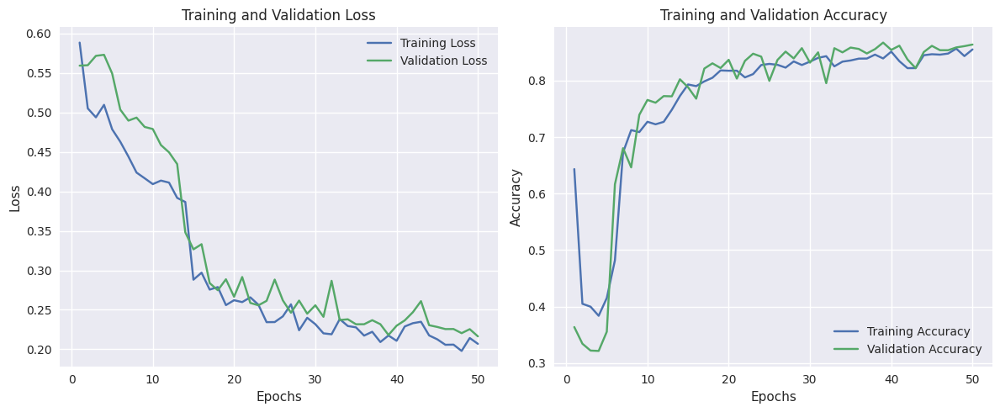

In [163]:
# TODO: Plot training and validation losses and accuracies
import matplotlib.pyplot as plt

def plot_metrics(train_losses, val_losses, train_accs, val_accs):
    epochs = range(1, len(train_losses) + 1)

    # Plotting training and validation losses
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training Loss')
    plt.plot(epochs, val_losses, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plotting training and validation accuracies
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accs, label='Training Accuracy')
    plt.plot(epochs, val_accs, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Call the function with your data
plot_metrics(train_losses, val_losses, train_accs, val_accs)


## Plottings

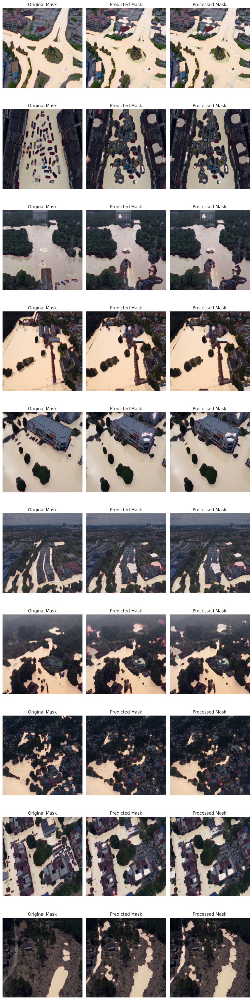

In [164]:
fig, axes = plt.subplots(10, 3, figsize=(10, 40))
axes = axes.flatten()

for i in range(10):
    img = goh_set[i][0].permute(1, 2, 0)
    msk = goh_set[i][1].squeeze() 

    axes[3 * i].set_title("Original Mask")
    axes[3 * i].imshow(img) 
    axes[3 * i].imshow(msk, alpha=0.5)
    axes[3 * i].axis('off')

    axes[3 * i + 1].set_title("Predicted Mask")
    input_image = goh_set[i][0][None, ...].to(device) 
    pred = unet(input_image)  
    pred = pred.detach().cpu().squeeze().numpy() 
    axes[3 * i + 1].imshow(img)  
    axes[3 * i + 1].imshow(pred, alpha=0.5)  
    axes[3 * i + 1].axis('off') 

    axes[3 * i + 2].set_title("Processed Mask")
    bin_pred = (pred >= 0.5).astype(np.uint8)  
    axes[3 * i + 2].imshow(img)  
    axes[3 * i + 2].imshow(bin_pred, alpha=0.5)  
    axes[3 * i + 2].axis('off')  

plt.tight_layout()  
plt.show()  


1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?
    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?
    - Dice and Jaccard Losses vs. Cross-Entropy or Mean Squared Error:
  
        Sensitivity to Class Imbalances: Cross-Entropy is typically sensitive to class imbalances, favoring the majority class which can skew the training towards more frequently appearing labels. Mean Squared Error (MSE), although primarily used in regression, when adapted for classification, does not address class imbalance directly and can similarly suffer. In contrast, Dice and Jaccard losses, both based on set theory, are more robust against class imbalances. They evaluate the ratio of the intersection over union (Jaccard) or twice the intersection over the sum of both sets (Dice), which naturally gives importance to minority classes, improving model performance in imbalanced scenarios.
    - Advantages in Spatial Overlap: Both Dice and Jaccard losses excel in scenarios where the preservation of spatial relationships is critical. These losses directly measure how well the predicted segmentation overlaps with the ground truth, making them particularly suited for tasks like medical image segmentation where precise delineation of areas (like tumors) is crucial.


2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.
    - High and low loss scores in the context of segmentation models like U-Net can be very telling:
    - High Loss Scores: High values in losses like Dice or Jaccard indicate poor overlap between the model's predictions and the actual data. This could mean the model is struggling with capturing the true extent or shape of the target regions, potentially due to inadequate model training, insufficient data, or inappropriate model complexity.
    - Low Loss Scores: Conversely, low scores suggest good model performance, with predictions closely matching the ground truth. This indicates effective learning and generalization, suggesting that the model's capacity and training regime are well-suited to the task at hand.

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?

   - In cluttered environments, the attention mechanism enhances segmentation accuracy by focusing the model's resources on areas of interest while ignoring irrelevant regions. This focusing ability refines the segmentation process by adaptively reweighting the feature maps generated by the convolutional layers, thus improving the precision of the segmentation in complex scenes with overlapping objects or varied textures.

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?

  - Skip connections in U-Net architecture play a crucial role by carrying fine-grained details from the encoder (downsampling path) to the decoder (upsampling path). These connections help restore spatial hierarchies and details lost during downsampling, enhancing the accuracy and clarity of the segmentation outputs, especially in capturing edges and small details.

Explain the difference between the predicted and processed mask above.
- Predicted Mask: This represents the raw output from the U-Net model, reflecting probability maps where each pixel value indicates the likelihood of belonging to a target class. This mask is typically soft, containing probabilities rather than binary decisions.
- Processed Mask: Following the prediction, the processed mask is obtained by applying a threshold (e.g., 0.5) to convert probabilities into binary values (0 or 1). This binarization step turns the soft probability map into a hard segmentation mask, which is more practical for measuring performance or applying in real-world scenarios. This step is crucial for using the model's outputs in downstream applications, where definite decisions (e.g., is this pixel part of an object?) are needed.